# Instance Segmentation de Danos em Automóveis usando TF Model Garden


Este notebook faz o treinamento (fine-tuning) de uma [Mask R-CNN](https://arxiv.org/abs/1703.06870) implementada no [pacote TensorFlow Model Garden](https://pypi.org/project/tf-models-official/) (tensorflow-models). O backbone utilizado (checkpoint) também foi obtido do [Model Garden](https://www.tensorflow.org/tfmodels).  
  
Descrição do Model Garden:  
"[Model Garden](https://www.tensorflow.org/tfmodels) contains a collection of state-of-the-art models, implemented with TensorFlow's high-level APIs. The implementations demonstrate the best practices for modeling, letting users to take full advantage of TensorFlow for their research and product development."

##Verifica se estamos usando GPU e qual sua configuração

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Oct  7 15:12:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


## Install Necessary Dependencies

In [ ]:
!python --version

Python 3.10.12


In [ ]:
!pip install -U -q "tf-models-official"
!pip install -U -q remotezip tqdm opencv-python einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.3/106.3 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 25.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 4.3 MB/s eta 0:00:00


## Import required libraries

In [ ]:
import os
import io
import json
import tqdm
import shutil
import pprint
import pathlib
import tempfile
import requests
import collections
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from etils import epath
from IPython import display
from urllib.request import urlopen

In [ ]:
import orbit
import tensorflow as tf
import tensorflow_models as tfm
import tensorflow_datasets as tfds

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.data import tfrecord_lib
from official.vision.serving import export_saved_model_lib
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder
from official.vision.utils.object_detection import visualization_utils
from official.vision.ops.preprocess_ops import normalize_image, resize_and_crop_image
from official.vision.data.create_coco_tf_record import coco_annotations_to_lists

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

ModuleNotFoundError: ignored

## Definição da quantidade de classes do dataset

In [ ]:
# Acho que se colocar aqui um numero x menor que o total de categorias, vai considerar apenas as x primeiras categorias e
#processar apenas as imagens dessas categorias. Verificar.
NUM_CLASSES = 6

## Download dataset e conversão para TFRecord
Faz download do dataset (imagens do meu Google Drive e anotações do Cloud Storage) para a máquina usada pelo Colab.

In [ ]:
# @title Download JSONs de anotação

!gsutil cp gs://car-damage-recognition/instances_train2017.json .
!gsutil cp gs://car-damage-recognition/instances_val2017.json .
!gsutil cp gs://car-damage-recognition/instances_test2017.json .

Copying gs://car-damage-recognition/instances_train2017.json...
\ [1 files][ 19.6 MiB/ 19.6 MiB]                                                
Operation completed over 1 objects/19.6 MiB.                                     
Copying gs://car-damage-recognition/instances_val2017.json...
- [1 files][  5.7 MiB/  5.7 MiB]                                                
Operation completed over 1 objects/5.7 MiB.                                      
Copying gs://car-damage-recognition/instances_test2017.json...
- [1 files][  2.5 MiB/  2.5 MiB]                                                
Operation completed over 1 objects/2.5 MiB.                                      


In [ ]:
# @title Funções para parsing das anotações do dataset CarDD

def get_category_map(annotation_path, num_classes):
  with epath.Path(annotation_path).open() as f:
      data = json.load(f)

  category_map = {id+1: {'id': cat_dict['id'],
                       'name': cat_dict['name']}
                  for id, cat_dict in enumerate(data['categories'][:num_classes])}
  return category_map

class CarDDAnnotation:
  """CarDD annotation helper class.
  """

  def __init__(self, annotation_path):
    with epath.Path(annotation_path).open() as f:
      data = json.load(f)
    self._data = data

    img_id2annotations = collections.defaultdict(list)
    for a in self._data.get('annotations', []):
      if a['category_id'] in category_ids:
        img_id2annotations[a['image_id']].append(a)
    self._img_id2annotations = {
        k: list(sorted(v, key=lambda a: a['id']))
        for k, v in img_id2annotations.items()
    }

  @property
  def categories(self):
    """Return the category dicts, as sorted in the file."""
    return self._data['categories']

  @property
  def images(self):
    """Return the image dicts, as sorted in the file."""
    sub_images = []
    for image_info in self._data['images']:
      if image_info['id'] in self._img_id2annotations:
        sub_images.append(image_info)
    return sub_images

  def get_annotations(self, img_id):
    """Return all annotations associated with the image id string."""
    # Some images don't have any annotations. Return empty list instead.
    return self._img_id2annotations.get(img_id, [])

# MINHA ALTERACAO
# def _generate_tf_records(prefix, images_zip, annotation_file, num_shards=5):
# def _generate_tf_records(prefix, images_dir, annotation_file, num_shards=8):
#     """Generate TFRecords."""

#     lvis_annotation = CarDDAnnotation(annotation_file)

#     def _process_example(prefix, image_info, id_to_name_map):
#       # Search image dirs.

#       # MINHA ALTERACAO
#       # filename = pathlib.Path(image_info['coco_url']).name
#       filename = image_info['file_name']
#       #

#       image = tf.io.read_file(os.path.join(images_dir, filename))
#       instances = lvis_annotation.get_annotations(img_id=image_info['id'])

#       # MINHA ALTERACAO
#       # instances = [x for x in instances if x['id'] not in _INVALID_ANNOTATIONS]
#       #
#       # #print([x['category_id'] for x in instances])
#       # is_crowd = {'iscrowd': 0}
#       # instances = [dict(x, **is_crowd) for x in instances]
#       # neg_category_ids = image_info.get('neg_category_ids', [])
#       # not_exhaustive_category_ids = image_info.get(
#       #     'not_exhaustive_category_ids', []
#       # )

#       data, _ = coco_annotations_to_lists(instances,
#                                           id_to_name_map,
#                                           image_info['height'],
#                                           image_info['width'],
#                                           include_masks=True)
#       # data['category_id'] = [id-1 for id in data['category_id']]
#       keys_to_features = {
#           'image/encoded':
#               tfrecord_lib.convert_to_feature(image.numpy()),
#           'image/filename':
#                tfrecord_lib.convert_to_feature(filename.encode('utf8')),
#           'image/format':
#               tfrecord_lib.convert_to_feature('jpg'.encode('utf8')),
#           'image/height':
#               tfrecord_lib.convert_to_feature(image_info['height']),
#           'image/width':
#               tfrecord_lib.convert_to_feature(image_info['width']),
#           'image/source_id':
#               tfrecord_lib.convert_to_feature(str(image_info['id']).encode('utf8')),
#           'image/object/bbox/xmin':
#               tfrecord_lib.convert_to_feature(data['xmin']),
#           'image/object/bbox/xmax':
#               tfrecord_lib.convert_to_feature(data['xmax']),
#           'image/object/bbox/ymin':
#               tfrecord_lib.convert_to_feature(data['ymin']),
#           'image/object/bbox/ymax':
#               tfrecord_lib.convert_to_feature(data['ymax']),
#           'image/object/class/text':
#               tfrecord_lib.convert_to_feature(data['category_names']),
#           'image/object/class/label':
#               tfrecord_lib.convert_to_feature(data['category_id']),
#           'image/object/is_crowd':
#               tfrecord_lib.convert_to_feature(data['is_crowd']),
#           'image/object/area':
#               tfrecord_lib.convert_to_feature(data['area'], 'float_list'),
#           'image/object/mask':
#               tfrecord_lib.convert_to_feature(data['encoded_mask_png'])
#       }
#       # print(keys_to_features['image/object/class/label'])
#       example = tf.train.Example(
#           features=tf.train.Features(feature=keys_to_features))
#       return example



#     # file_names = [f"{prefix}/{pathlib.Path(image_info['coco_url']).name}"
#     #               for image_info in lvis_annotation.images]
#     # _extract_images(images_zip, file_names)
#     writers = [
#         tf.io.TFRecordWriter(
#             tf_records_dir + prefix +'-%05d-of-%05d.tfrecord' % (i, num_shards))
#         for i in range(num_shards)
#     ]
#     id_to_name_map = {cat_dict['id']: cat_dict['name']
#                       for cat_dict in lvis_annotation.categories[:NUM_CLASSES]}
#     # print(id_to_name_map)
#     for idx, image_info in enumerate(tqdm.tqdm(lvis_annotation.images)):
#       # MINHA ALTERAÇÃO
#       # img_data = requests.get(image_info['coco_url'], stream=True).content
#       #img_name = image_info['coco_url'].split('/')[-1]
#       # with open(os.path.join(IMGS_DIR, img_name), 'wb') as handler:
#       #     handler.write(img_data)
#       tf_example = _process_example(prefix, image_info, id_to_name_map)
#       writers[idx % num_shards].write(tf_example.SerializeToString())

#     del cardd_annotation

In [ ]:
# @title Obtenção das categorias
train_annotation_path = './instances_train2017.json'
valid_annotation_path = './instances_val2017.json'
test_annotation_path = './instances_test2017.json'

# tf_records_dir = './cardd_tfrecords/'

# if not os.path.exists(tf_records_dir):
#   os.mkdir(tf_records_dir)

category_index = get_category_map(valid_annotation_path, NUM_CLASSES)
category_ids = list(category_index.keys())
category_index

{1: {'id': 1, 'name': 'dent'},
 2: {'id': 2, 'name': 'scratch'},
 3: {'id': 3, 'name': 'crack'},
 4: {'id': 4, 'name': 'glass shatter'},
 5: {'id': 5, 'name': 'lamp broken'},
 6: {'id': 6, 'name': 'tire flat'}}

In [ ]:
# @title Download do das imagens - SÓ PRECISA RODAR UMA ÚNICA VEZ, ANTES DE PARA GERAR OS TFRecords

from google.colab import drive
drive.mount('/content/drive')

if not os.path.exists('./cardd_dataset/'):
  os.mkdir('./cardd_dataset/')
!cp -r /content/drive/My\ Drive/instance_segmentation_data/CarDD_COCO/train2017 /content/cardd_dataset
!cp -r /content/drive/My\ Drive/instance_segmentation_data/CarDD_COCO/val2017 /content/cardd_dataset

Mounted at /content/drive


In [ ]:
!cp -r /content/drive/My\ Drive/instance_segmentation_data/CarDD_COCO/test2017 /content/cardd_dataset

##Geração dos TFRecords - SÓ PRECISA RODAR UMA VEZ ##

In [ ]:
def _generate_tf_records(prefix, images_dir, annotation_file, output_dir, num_shards=8):
    """Generate TFRecords."""

    cardd_annotation = CarDDAnnotation(annotation_file)

    def _process_example(prefix, image_info, id_to_name_map):
      # Search image dirs.
      filename = image_info['file_name']

      image = tf.io.read_file(os.path.join(images_dir, filename))
      instances = cardd_annotation.get_annotations(img_id=image_info['id'])

      # MINHA ALTERACAO
      # instances = [x for x in instances if x['id'] not in _INVALID_ANNOTATIONS]
      #
      # #print([x['category_id'] for x in instances])
      # is_crowd = {'iscrowd': 0}
      # instances = [dict(x, **is_crowd) for x in instances]
      # neg_category_ids = image_info.get('neg_category_ids', [])
      # not_exhaustive_category_ids = image_info.get(
      #     'not_exhaustive_category_ids', []
      # )

      data, _ = coco_annotations_to_lists(instances,
                                          id_to_name_map,
                                          image_info['height'],
                                          image_info['width'],
                                          include_masks=True)
      # data['category_id'] = [id-1 for id in data['category_id']]
      keys_to_features = {
          'image/encoded':
              tfrecord_lib.convert_to_feature(image.numpy()),
          'image/filename':
               tfrecord_lib.convert_to_feature(filename.encode('utf8')),
          'image/format':
              tfrecord_lib.convert_to_feature('jpg'.encode('utf8')),
          'image/height':
              tfrecord_lib.convert_to_feature(image_info['height']),
          'image/width':
              tfrecord_lib.convert_to_feature(image_info['width']),
          'image/source_id':
              tfrecord_lib.convert_to_feature(str(image_info['id']).encode('utf8')),
          'image/object/bbox/xmin':
              tfrecord_lib.convert_to_feature(data['xmin']),
          'image/object/bbox/xmax':
              tfrecord_lib.convert_to_feature(data['xmax']),
          'image/object/bbox/ymin':
              tfrecord_lib.convert_to_feature(data['ymin']),
          'image/object/bbox/ymax':
              tfrecord_lib.convert_to_feature(data['ymax']),
          'image/object/class/text':
              tfrecord_lib.convert_to_feature(data['category_names']),
          'image/object/class/label':
              tfrecord_lib.convert_to_feature(data['category_id']),
          'image/object/is_crowd':
              tfrecord_lib.convert_to_feature(data['is_crowd']),
          'image/object/area':
              tfrecord_lib.convert_to_feature(data['area'], 'float_list'),
          'image/object/mask':
              tfrecord_lib.convert_to_feature(data['encoded_mask_png'])
      }
      # print(keys_to_features['image/object/class/label'])
      example = tf.train.Example(
          features=tf.train.Features(feature=keys_to_features))
      return example



    # file_names = [f"{prefix}/{pathlib.Path(image_info['coco_url']).name}"
    #               for image_info in lvis_annotation.images]
    # _extract_images(images_zip, file_names)
    writers = [
        tf.io.TFRecordWriter(
            output_dir + prefix +'-%05d-of-%05d.tfrecord' % (i, num_shards))
        for i in range(num_shards)
    ]
    id_to_name_map = {cat_dict['id']: cat_dict['name']
                      for cat_dict in cardd_annotation.categories[:NUM_CLASSES]}
    # print(id_to_name_map)
    for idx, image_info in enumerate(tqdm.tqdm(cardd_annotation.images)):
      # MINHA ALTERAÇÃO
      # img_data = requests.get(image_info['coco_url'], stream=True).content
      #img_name = image_info['coco_url'].split('/')[-1]
      # with open(os.path.join(IMGS_DIR, img_name), 'wb') as handler:
      #     handler.write(img_data)
      tf_example = _process_example(prefix, image_info, id_to_name_map)
      writers[idx % num_shards].write(tf_example.SerializeToString())

    del cardd_annotation

In [ ]:
train_prefix = 'train'
valid_prefix = 'val'
test_prefix = 'test'

TRAIN_IMGS_DIR = './cardd_dataset/train2017/'
VALID_IMGS_DIR = './cardd_dataset/val2017/'
TEST_IMGS_DIR = './cardd_dataset/test2017/'


tf_records_dir = './cardd_tfrecords_all_sets/'
if not os.path.exists(tf_records_dir):
  os.mkdir(tf_records_dir)

_generate_tf_records(train_prefix,
                     TRAIN_IMGS_DIR,
                     train_annotation_path,
                     tf_records_dir,
                     16)

_generate_tf_records(valid_prefix,
                     VALID_IMGS_DIR,
                     valid_annotation_path,
                     tf_records_dir,
                     8)

_generate_tf_records(test_prefix,
                     TEST_IMGS_DIR,
                     test_annotation_path,
                     tf_records_dir,
                     4)

In [ ]:
!gsutil cp -r './cardd_tfrecords_all_sets' gs://car-damage-recognition

Copying file://./cardd_tfrecords_all_sets/val-00001-of-00008.tfrecord [Content-Type=application/octet-stream]...
Copying file://./cardd_tfrecords_all_sets/train-00013-of-00016.tfrecord [Content-Type=application/octet-stream]...
Copying file://./cardd_tfrecords_all_sets/train-00006-of-00016.tfrecord [Content-Type=application/octet-stream]...
Copying file://./cardd_tfrecords_all_sets/train-00014-of-00016.tfrecord [Content-Type=application/octet-stream]...
\ [4 files][459.5 MiB/459.5 MiB]   28.0 MiB/s                                   
==> NOTE: You are performing a sequence of gsutil operations that may
run significantly faster if you instead use gsutil -m cp ... Please
see the -m section under "gsutil help options" for further information
about when gsutil -m can be advantageous.

Copying file://./cardd_tfrecords_all_sets/train-00005-of-00016.tfrecord [Content-Type=application/octet-stream]...
Copying file://./cardd_tfrecords_all_sets/train-00003-of-00016.tfrecord [Content-Type=applicat

## Configure the MaskRCNN Resnet FPN COCO model for custom dataset

In [ ]:
#para pegar tfrecords do Cloud Storage
train_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/train*'
valid_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/val*'
test_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/test*'

No Model Garden, as coleções de parâmetros que definem os modelos são chamadas de *configs*. Model Garden pode criar uma config baseado em um conjunto de parâmetros usando uma [factory](https://en.wikipedia.org/wiki/Factory_method_pattern).


Usamos a  configuração de experimento chamada `maskrcnn_resnetfpn_coco`, definida em `tfm.vision.configs.maskrcnn.maskrcnn_resnetfpn_coco`.

Lista de todos os experimentos registrados: https://www.tensorflow.org/api_docs/python/tfm/core/exp_factory/get_exp_config

The configuration defines an experiment to train a Mask R-CNN model with resnet50 as backbone and FPN as decoder. Default Configuration is trained on [COCO](https://cocodataset.org/) train2017 and evaluated on [COCO](https://cocodataset.org/) val2017.

There are also other alternative experiments available such as
`maskrcnn_mobilenet_coco`,
`maskrcnn_spinenet_coco` and more. One can switch to them by changing the experiment name argument to the `get_exp_config` function.

In [ ]:
exp_config = exp_factory.get_exp_config('maskrcnn_resnetfpn_coco')

### Adjust the model and dataset configurations so that it works with custom dataset.

In [ ]:
nome_experimento = 'experiment-Resnet50-GPU-V100-high-ram'

In [ ]:
checkpoint_path = 'gs://car-damage-recognition/backend_checkpoints/resnet-50/ckpt-62400'

In [ ]:
BATCH_SIZE = 8

HEIGHT, WIDTH = 256, 256
IMG_SHAPE = [HEIGHT, WIDTH, 3]

# Backbone Config
exp_config.task.annotation_file = None
exp_config.task.freeze_backbone = True

exp_config.task.init_checkpoint = checkpoint_path
exp_config.task.init_checkpoint_modules = "backbone"

# Model Config
exp_config.task.model.num_classes = NUM_CLASSES + 1
exp_config.task.model.input_size = IMG_SHAPE

# Training Data Config
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = BATCH_SIZE
exp_config.task.train_data.shuffle_buffer_size = 64
exp_config.task.train_data.parser.aug_scale_max = 1.0
exp_config.task.train_data.parser.aug_scale_min = 1.0

# Validation Data Config
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = BATCH_SIZE

### Adjust the trainer configuration.

In [ ]:
quantidade_exemplos_treino = 2816
quantidade_exemplos_val = 810

steps_per_epoch = quantidade_exemplos_treino//BATCH_SIZE
quantidade_epocas = 30
train_steps = steps_per_epoch * quantidade_epocas

exp_config.trainer.steps_per_loop = steps_per_epoch
exp_config.trainer.summary_interval = steps_per_epoch * 2
exp_config.trainer.checkpoint_interval = steps_per_epoch * 2
exp_config.trainer.validation_interval = steps_per_epoch
exp_config.trainer.validation_steps =  quantidade_exemplos_val//BATCH_SIZE
#
exp_config.trainer.train_steps = train_steps

# TODO verificar se tem necessidade de warmup
# exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = train_steps

#colocar learning rate como no artigo do dataset, como nas linhas comentadas abaixo:
exp_config.trainer.optimizer_config.learning_rate.type = 'stepwise'
exp_config.trainer.optimizer_config.learning_rate.stepwise.boundaries = [steps_per_epoch * 20, steps_per_epoch * 28]
exp_config.trainer.optimizer_config.learning_rate.stepwise.values = [0.01, 0.001, 0.0001]

# exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
# exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
# exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.07
# exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

### Print the modified configuration.

In [ ]:

pp.pprint(exp_config.as_dict())
display.Javascript("google.colab.output.setIframeHeight('500px');")

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': True,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'allowed_mask_class_ids': None,
                'annotation_file': None,
         

<IPython.core.display.Javascript object>

### Define pastas onde o treinamento irá gravar

In [ ]:
nome_experimento

'experiment-Resnet50-GPU-V100-high-ram'

In [ ]:
# para GPU do Colab Free
# model_dir = './trained_model/'
# export_dir ='./exported_model/'
# if not os.path.exists(model_dir):
#   os.mkdir(model_dir)

# para TPU

# model_dir = 'gs://car-damage-recognition/trained_model_resnet50-frozen-backend/'
# export_dir ='gs://car-damage-recognition/exported_model_resnet50-frozen-backend/'

# model_dir = 'gs://car-damage-recognition/trained_model_'+ nome_experimento + '/'
# export_dir ='gs://car-damage-recognition/exported_model_'+ nome_experimento + '/'
model_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/trained_model/'
export_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/exported_model/'

### Set up the distribution strategy.

In [ ]:
# @title Para uso de GPU
# DESCOMENTAR SE FOR USAR GPU

logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

logical_device_names

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


Done


['/device:CPU:0', '/device:GPU:0']

## Create the `Task` object (`tfm.core.base_task.Task`) from the `config_definitions.TaskConfig`.

The `Task` object has all the methods necessary for building the dataset, building the model, and running training & evaluation. These methods are driven by `tfm.core.train_lib.run_experiment`.

In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize a batch of the data.

In [ ]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')


images.shape: (8, 256, 256, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['anchor_boxes', 'image_info', 'rpn_score_targets', 'rpn_box_targets', 'gt_boxes', 'gt_classes', 'gt_outer_boxes', 'gt_masks'])


### Create Category Index Dictionary to map the labels to coressponding label names

In [ ]:
tf_ex_decoder = TfExampleDecoder(include_mask=True)

### Helper Function for Visualizing the results from TFRecords
Use `visualize_boxes_and_labels_on_image_array` from `visualization_utils` to draw boudning boxes on the image.

In [ ]:
def show_batch(raw_records):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    # print(decoded_tensors['groundtruth_instance_masks'].numpy().shape)
    # print(decoded_tensors.keys())
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        min_score_thresh=min_score_thresh,
        instance_masks=decoded_tensors['groundtruth_instance_masks'].numpy().astype('uint8'),
        line_thickness=4)

    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image-{i+1}")
  plt.show()

### Visualization of Train Data

The bounding box detection has three components
  1. Class label of the object detected.
  2. Percentage of match between predicted and ground truth bounding boxes.
  3. Instance Segmentation Mask

**Note**: The reason of everything is 100% is because we are visualising the groundtruth

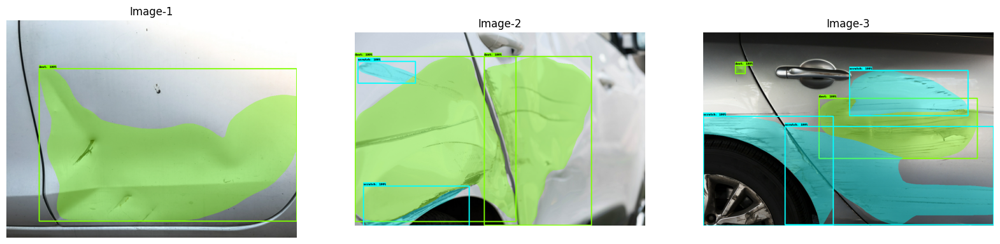

In [ ]:
buffer_size = 100
num_of_examples = 3

train_tfrecords = tf.io.gfile.glob(exp_config.task.train_data.input_path)
raw_records = tf.data.TFRecordDataset(train_tfrecords).shuffle(buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records)

## Train and evaluate

We follow the COCO challenge tradition to evaluate the accuracy of object detection based on mAP(mean Average Precision). Please check [here](https://cocodataset.org/#detection-eval) for detail explanation of how evaluation metrics for detection task is done.

**IoU**: is defined as the area of the intersection divided by the area of the union of a predicted bounding box and ground truth bounding box.

In [ ]:
# !rm -r ./trained_model
# !rm -r ./exported_model

In [ ]:
#se der erro durante o treinamento em TPU, pode ser necessário dar permissão de Object Admin para o usuário da TPU no Cloud Storage
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
restoring or initializing model...
restored model from gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/ckpt-2816.
restored from checkpoint: gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/ckpt-2816
train | step:   2816 | training until step 3168...
train | step:   3168 | steps/sec:    1.8 | output: 
    {'frcnn_box_loss': 0.25046957,
     'frcnn_cls_loss': 0.12191469,
     'learning_rate': 0.01,
     'mask_loss': 0.28569892,
     'model_loss': 0.7004101,
     'rpn_box_loss': 0.02441157,
     'rpn_score_loss': 0.01791529,
     'total_loss': 1.0409757,
     'training_loss': 1.0409757}
 eval | step:   3168 | running 101 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.07s).
Accumulating evaluation results...
DONE (t=0.94s).
 Average Precis

## Load logs in tensorboard

In [ ]:
# uri_trained_model = 'gs://car-damage-recognition/trained_model_' + nome_experimento
#para trazer o resultado do treinamento do Cloud Storage para a máquina
# !gsutil cp -r gs://car-damage-recognition/trained_model_resnet50-frozen-backend-batch64 '.'
!gsutil cp -r gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram .

Copying gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/fingerprint.pb...
/ [1 files][   56.0 B/   56.0 B]                                                
==> NOTE: You are performing a sequence of gsutil operations that may
run significantly faster if you instead use gsutil -m cp ... Please
see the -m section under "gsutil help options" for further information
about when gsutil -m can be advantageous.

Copying gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/params.yaml...
Copying gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/saved_model.pb...
Copying gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/variables/variables.data-00000-of-00001...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default 

In [ ]:
#para funcionar, deve-se permitir cookies de terceiros no navegador
#no Firefox, desativar proteção aprimorada contra rastreamento
# %load_ext tensorboard
%reload_ext tensorboard
# dir_trained_model = "./trained_model_" + nome_experimento
# %tensorboard --logdir trained_model_resnet50-frozen-backend-batch64 #--port=8008
%tensorboard --logdir experiment-Resnet50-GPU-V100-high-ram

Output hidden; open in https://colab.research.google.com to view.

## Saving and exporting the trained model

The `keras.Model` object returned by `train_lib.run_experiment` expects the data to be normalized by the dataset loader using the same mean and variance statiscics in `preprocess_ops.normalize_image(image, offset=MEAN_RGB, scale=STDDEV_RGB)`. This export function handles those details, so you can pass `tf.uint8` images and get the correct results.

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

INFO:tensorflow:Assets written to: gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram/exported_model/assets


In [ ]:
model_dir

'gs://car-damage-recognition/trained_model_resnet50-frozen-backend-batch64/'

## Inference from Trained Model

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)



def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

## Importing SavedModel

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

## Visualize test data

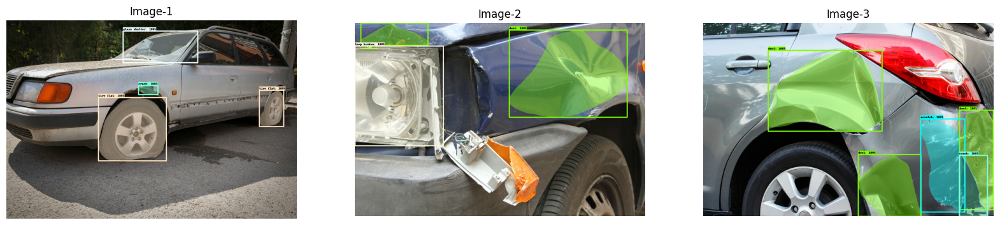

In [ ]:
num_of_examples = 3

# test_tfrecords = tf.io.gfile.glob('./cardd_tfrecords/val*')
#para TPU, lê do Cloud Storage
test_tfrecords = tf.io.gfile.glob('gs://car-damage-recognition/cardd_tfrecords_all_sets/val*')
#
test_ds = tf.data.TFRecordDataset(test_tfrecords).take(num_of_examples)
show_batch(test_ds)

## Visualize predictions

In [ ]:
def reframe_image_corners_relative_to_boxes(boxes):
  """Reframe the image corners ([0, 0, 1, 1]) to be relative to boxes.
  The local coordinate frame of each box is assumed to be relative to
  its own for corners.
  Args:
    boxes: A float tensor of [num_boxes, 4] of (ymin, xmin, ymax, xmax)
      coordinates in relative coordinate space of each bounding box.
  Returns:
    reframed_boxes: Reframes boxes with same shape as input.
  """
  ymin, xmin, ymax, xmax = (boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3])

  height = tf.maximum(ymax - ymin, 1e-4)
  width = tf.maximum(xmax - xmin, 1e-4)

  ymin_out = (0 - ymin) / height
  xmin_out = (0 - xmin) / width
  ymax_out = (1 - ymin) / height
  xmax_out = (1 - xmin) / width
  return tf.stack([ymin_out, xmin_out, ymax_out, xmax_out], axis=1)

def reframe_box_masks_to_image_masks(box_masks, boxes, image_height,
                                     image_width, resize_method='bilinear'):
  """Transforms the box masks back to full image masks.
  Embeds masks in bounding boxes of larger masks whose shapes correspond to
  image shape.
  Args:
    box_masks: A tensor of size [num_masks, mask_height, mask_width].
    boxes: A tf.float32 tensor of size [num_masks, 4] containing the box
           corners. Row i contains [ymin, xmin, ymax, xmax] of the box
           corresponding to mask i. Note that the box corners are in
           normalized coordinates.
    image_height: Image height. The output mask will have the same height as
                  the image height.
    image_width: Image width. The output mask will have the same width as the
                 image width.
    resize_method: The resize method, either 'bilinear' or 'nearest'. Note that
      'bilinear' is only respected if box_masks is a float.
  Returns:
    A tensor of size [num_masks, image_height, image_width] with the same dtype
    as `box_masks`.
  """
  resize_method = 'nearest' if box_masks.dtype == tf.uint8 else resize_method
  # TODO(rathodv): Make this a public function.
  def reframe_box_masks_to_image_masks_default():
    """The default function when there are more than 0 box masks."""

    num_boxes = tf.shape(box_masks)[0]
    box_masks_expanded = tf.expand_dims(box_masks, axis=3)

    resized_crops = tf.image.crop_and_resize(
        image=box_masks_expanded,
        boxes=reframe_image_corners_relative_to_boxes(boxes),
        box_indices=tf.range(num_boxes),
        crop_size=[image_height, image_width],
        method=resize_method,
        extrapolation_value=0)
    return tf.cast(resized_crops, box_masks.dtype)

  image_masks = tf.cond(
      tf.shape(box_masks)[0] > 0,
      reframe_box_masks_to_image_masks_default,
      lambda: tf.zeros([0, image_height, image_width, 1], box_masks.dtype))
  return tf.squeeze(image_masks, axis=3)

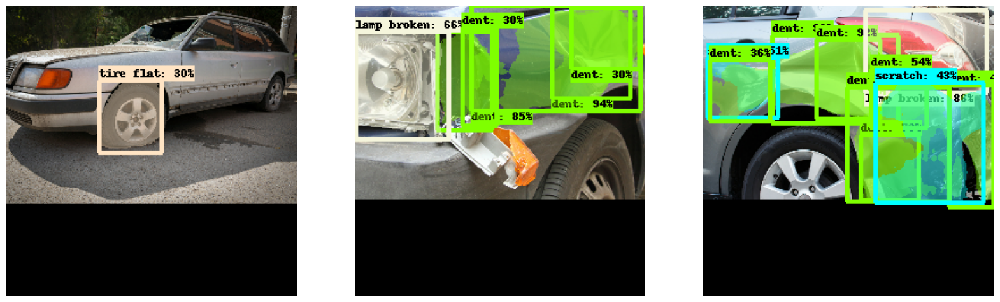

In [ ]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.30

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  # Visualize detection and masks
  if 'detection_masks' in result:
    # we need to convert np.arrays to tensors
    detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
    detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])
    detection_masks_reframed = reframe_box_masks_to_image_masks(
              detection_masks, detection_boxes/256.0,
                image_np.shape[0], image_np.shape[1])
    detection_masks_reframed = tf.cast(
        detection_masks_reframed > min_score_thresh,
        np.uint8)

    result['detection_masks_reframed'] = detection_masks_reframed.numpy()
  visualization_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        result['detection_boxes'][0].numpy(),
        (result['detection_classes'][0] + 0).numpy().astype(int),
        result['detection_scores'][0].numpy(),
        category_index=category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        instance_masks=result.get('detection_masks_reframed', None),
        line_thickness=4)

  plt.imshow(image_np)
  plt.axis("off")

plt.show()

## Teste

In [ ]:
exp_config.task.per_category_metrics = True

# Validation Data Config
exp_config.task.validation_data.input_path = test_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = 1

In [ ]:
quantidade_exemplos_test = 374
# exp_config.trainer.validation_interval = steps_per_epoch
exp_config.trainer.validation_steps =  quantidade_exemplos_test
#exp_config.trainer.validation_steps =  -1 # consome o dataset inteiro

In [ ]:
nome_experimento_teste = 'experiment-Resnet50-GPU-V100-high-ram-test'
# test_logging_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/test_logging_dir/'
model_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento_teste + '/trained_model/'

In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
restoring or initializing model...
restored model from gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram-test/trained_model/ckpt-10560.
restored from checkpoint: gs://car-damage-recognition/experiments/experiment-Resnet50-GPU-V100-high-ram-test/trained_model/ckpt-10560
 eval | step:  10560 | running 374 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.03s).
Accumulating evaluation results...
DONE (t=0.48s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.541
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.334
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.0